###image-similarity-measures

In [ ]:
%%capture
!pip3 install image-similarity-measures
!pip install sewar

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
from skimage import io

from skimage import data, img_as_float
from skimage.metrics import mean_squared_error

import numpy as np
import cv2
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import glob
import matplotlib.image as mpimg
import random

from tensorflow.keras.preprocessing.image import ImageDataGenerator, load_img
from tensorflow.keras.preprocessing.image import img_to_array, array_to_img 
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, SeparableConv2D, MaxPooling2D, Lambda
from tensorflow.keras.layers import Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.layers import Conv2DTranspose, Conv2D, add, concatenate
from tensorflow.keras.layers import LeakyReLU, Activation, Reshape
from tensorflow.keras.utils import plot_model
from tensorflow.keras.optimizers import Adam 
from tensorflow.keras.callbacks import ModelCheckpoint,ReduceLROnPlateau
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from keras.utils.vis_utils import plot_model

import numpy as np
from keras.models import Sequential
#from keras.optimizers import Adam
from tensorflow.keras.optimizers import Adam
from keras.layers import Dense, Conv2D, Flatten, Reshape, Conv2DTranspose
from keras.layers import LeakyReLU, Dropout
import matplotlib.pyplot as plt
#from keras.utils import plot_model
from keras.utils.vis_utils import plot_model
from keras.preprocessing.image import ImageDataGenerator
from keras.models import load_model

In [ ]:
from skimage.metrics import structural_similarity as ssim
from image_similarity_measures.quality_metrics import psnr, uiq, fsim, issm, sre
from sewar.full_ref import rmse, ergas, scc, rase, sam, msssim, vifp

In [ ]:
#load files:
from google.colab import files
files.upload()

Saving 10epochsort.zip to 10epochsort.zip


{'10epochsort.zip': b'PK\x03\x04\x14\x00\x00\x00\x08\x00Ue\x87T\x8b\xeb\x17!!\x02\x00\x00\x04 \x00\x00\x1e\x00\x00\x0010epochsort/prostate/.DS_Store\xed\x99\xcfj\x13A\x1c\xc7g\xd2Tg)\xe2\x1e\nVPX\x0f\x82\x87 \xd9?\xa1^\x844\x8d\x87\x1e\x04aE\xd1*\xedn74\x0b\x9b\x9d\x90l\xba\xd44\x92{\xdf\xa0\xbe\x82\xe0\x1bx\xf1 \xf8\x00\xfe\xb9\xf9\n>A\xdd\xcd\xfc\x12g\xb3\x1bA/J\xfa\xfb\xc0\xf0\xdd\xe473a>\x87YfB\x08\xa1\x8d\x81\xa7\x13\xb2A\x08aD\xa4\xbaF\na\xd0r\x94 o$\x8d&\xe3\tw\xd3i\x92\xb6U<\x13\x82 \x08\x82 \xff\x1c*\x82-x\xef#\x08r\x81I\xf7\x07\r\xb2\x0e9\x16I\xa1^\x82,KcTH\r\xb2\x0e9\x16I\xa1_\t\xb2\x0c\xc9 UH\r\xb2\x0e9\x16\t\x9b\x16\x85\xc3\x07\x85_\xa6pB\xa1*\xa4\x06Y\xff\xa3%#\xc8\x85B\x9c\xdd\xf5\x9d\x80\x1f\xb8A\xe6\xfc~\xf7|\xc2\xa4W\xd2\xc3\x8d\xfb]\xe8\xf1\xc9\xed\x06~?\xaaV\xbf\xd0\xd2Jy\xf5\xd2e\xc6\xd8\x1a\xbb\xc2^\xdam\x1e\xdb\x91\x13\r\xfa\r\xa7\xb7\x9b~z\xe4Dm\x17\x9e\x1fs\x1e\xcc\x9e\x1d\xf7\x89\xdf\x8a\xf7\xd4\xf5m\x1eF\x8e\x1f\xb6z\x93\xc1\xbe\xd7J\xba\xbcx\xea\x87\x1e\x8f\

In [ ]:
%%capture
#unzip -d target_directory zip_file
!unzip -d '/content/' 10epochsort.zip

In [ ]:
pathlung1 = '/content/10epochsort/lung/1'
pathlung2 = '/content/10epochsort/lung/2'
pathlung3 = '/content/10epochsort/lung/3'
pathlung4 = '/content/10epochsort/lung/4'
pathlung5 = '/content/10epochsort/lung/5'
pathlung = [pathlung1, pathlung2, pathlung3, pathlung4, pathlung5]

In [ ]:
pathbreast1 = '/content/10epochsort/breast/1'
pathbreast2 = '/content/10epochsort/breast/2'
pathbreast3 = '/content/10epochsort/breast/3'
pathbreast4 = '/content/10epochsort/breast/4'
pathbreast5 = '/content/10epochsort/breast/5'
pathbreast = [pathbreast1, pathbreast2, pathbreast3, pathbreast4, pathbreast5]

In [ ]:
pathkidney1 = '/content/10epochsort/kidney/1'
pathkidney2 = '/content/10epochsort/kidney/2'
pathkidney3 = '/content/10epochsort/kidney/3'
pathkidney = [pathkidney1, pathkidney2, pathkidney3]

In [ ]:
pathprostate1 = '/content/10epochsort/prostate/1'
pathprostate2 = '/content/10epochsort/prostate/2'
pathprostate3 = '/content/10epochsort/prostate/3'
pathprostate4 = '/content/10epochsort/prostate/4'
pathprostate = [pathprostate1, pathprostate2, pathprostate3, pathprostate4]

In [ ]:
def mse(imageA, imageB):
	# the 'Mean Squared Error' between the two images is the
	# sum of the squared difference between the two images;
	# NOTE: the two images must have the same dimension
	err = np.sum((imageA.astype("float") - imageB.astype("float")) ** 2)
	err /= float(imageA.shape[0] * imageA.shape[1])
	# return the MSE, the lower the error, the more "similar"
	# the two images are
	return err

In [ ]:
def metrics(path):
  DIM = 128
  lista = []
  for directory_path in glob.glob(path):
    for img_path in glob.glob(os.path.join(directory_path, "*.png")):
      data_img = io.imread(img_path)
      resized_img = cv2.resize(data_img, (DIM, DIM))
      lista.append(resized_img)
  #metrics
  SSIM = ssim(lista[0], lista[1], multichannel=True)
  PSNR = psnr(lista[0], lista[1])
  MSE = mse(lista[0], lista[1])
  UIQ = uiq(lista[0], lista[1])
  RMSE = rmse(lista[0], lista[1])
  ERGAS = ergas(lista[0], lista[1])
  SCC = scc(lista[0], lista[1])
  RASE = rase(lista[0], lista[1])
  SAM = sam(lista[0], lista[1])
  MSSSIM = msssim(lista[0], lista[1])
  titulo = "SSIM:%.2f ,PSNR:%.2f ,MSE:%.2f ,UIQ:%.2f ,RMSE:%.2f\nERGAS:%.2f ,SCC:%.2f ,RASE:%.2f ,SAM:%.2f ,MSSSIM:%.2f" % (SSIM, PSNR, MSE, UIQ, RMSE, ERGAS, SCC, RASE, SAM, MSSSIM)
  return lista[1], lista[0], titulo

In [ ]:
def plot_organ_img(path_list):
  for path in path_list:
    i = 0
    imgA, imgB, title = metrics(path)
    list_tmp = []
    list_tmp = [imgA, imgB]
    plt.figure(figsize=(8,8)) #sugiero 5,5
    columns = 2
    for j, image in enumerate(list_tmp):
      plt.subplot(len(list_tmp) / columns + 1, columns, j + 1)
      plt.imshow(array_to_img(image))
      plt.suptitle(title)
      plt.axis('off')
    plt.show()

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: ComplexWarning: Casting complex values to real discards the imaginary part


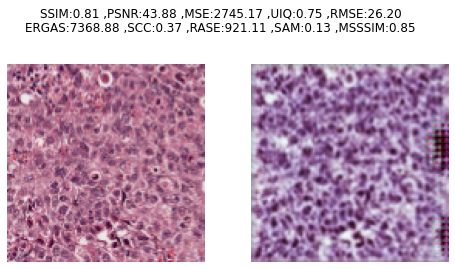

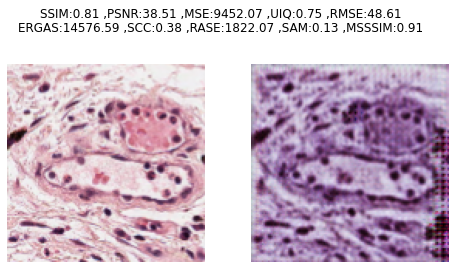

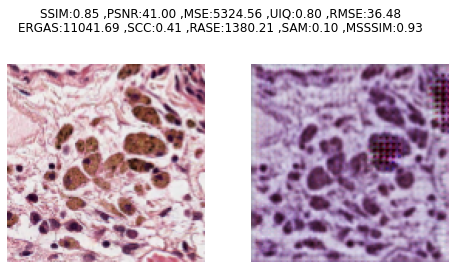

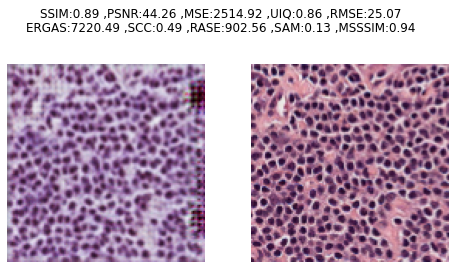

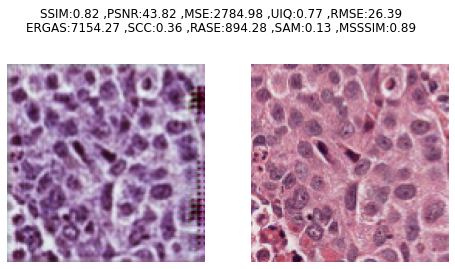

In [ ]:
plot_organ_img(pathlung)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: ComplexWarning: Casting complex values to real discards the imaginary part


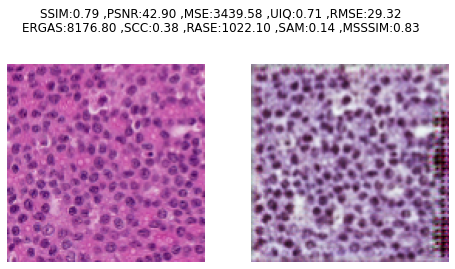

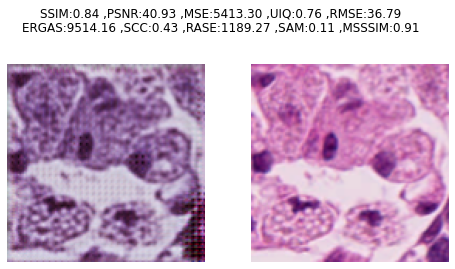

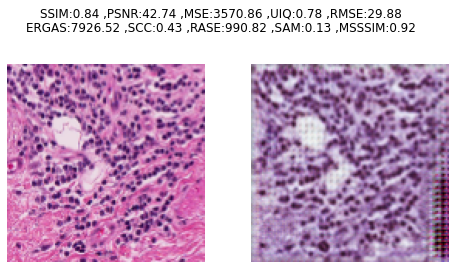

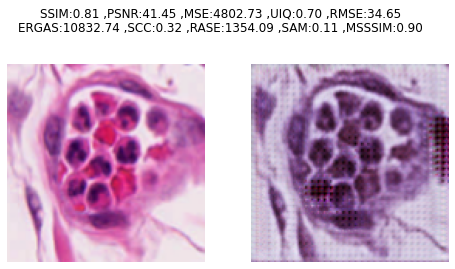

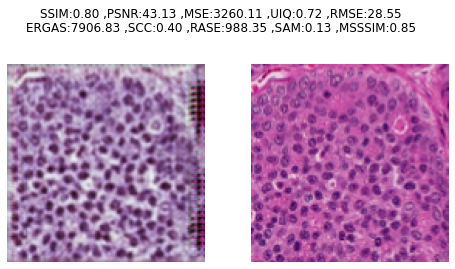

In [ ]:
plot_organ_img(pathbreast)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: ComplexWarning: Casting complex values to real discards the imaginary part


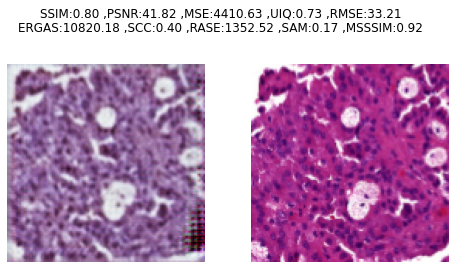

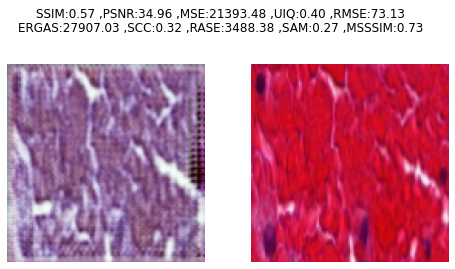

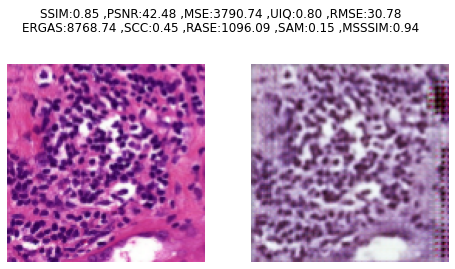

In [ ]:
plot_organ_img(pathkidney)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:20: ComplexWarning: Casting complex values to real discards the imaginary part


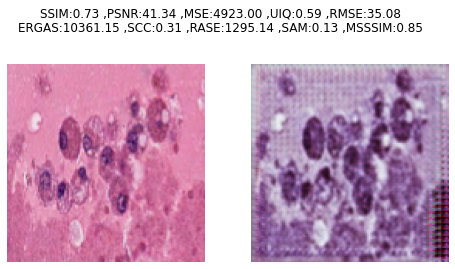

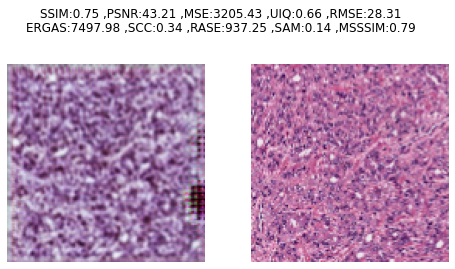

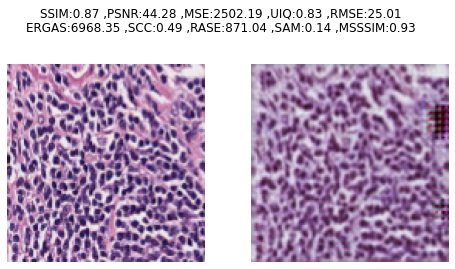

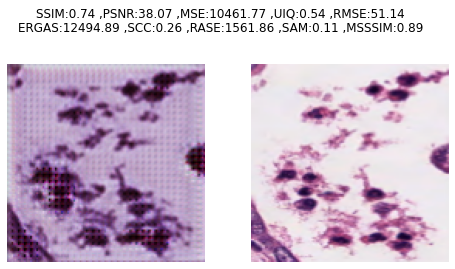

In [ ]:
plot_organ_img(pathprostate)